# Part 22

In [2]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
img = cv2.imread('/Users/elmiraghahramani/Documents/GitHub/computer_vision_Udemy_course/DATA/'+'00-puppy.jpg')

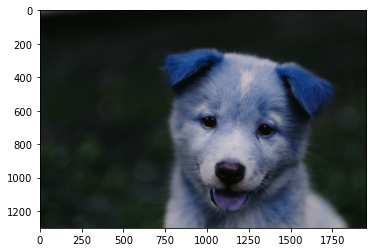

In [4]:
plt.imshow(img)

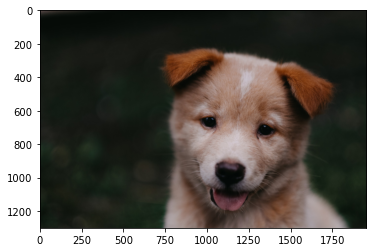

In [5]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

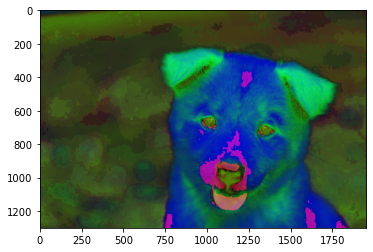

In [6]:
img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
plt.imshow(img)

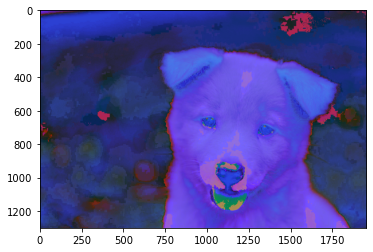

In [7]:
img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
plt.imshow(img)

# Part 23

In [9]:
import cv2
import matplotlib.pyplot as plt

In [13]:
img1 = cv2.imread('/Users/elmiraghahramani/Documents/GitHub/computer_vision_Udemy_course/DATA/'+'dog_backpack.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('/Users/elmiraghahramani/Documents/GitHub/computer_vision_Udemy_course/DATA/'+'watermark_no_copy.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

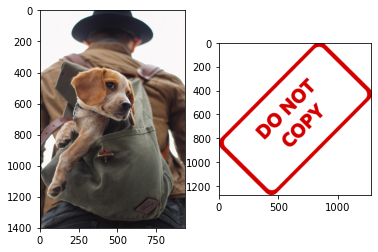

In [14]:
plt.subplot(1,2,1)
plt.imshow(img1)
plt.subplot(1,2,2)
plt.imshow(img2)

In [15]:
img2.shape

(1280, 1277, 3)

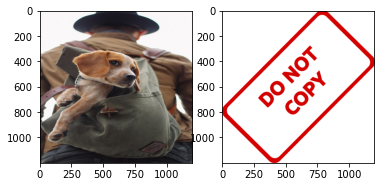

In [16]:
# Blending images of same size
img1 = cv2.resize(img1, (1200, 1200))
img2 = cv2.resize(img2, (1200, 1200))
plt.subplot(1,2,1)
plt.imshow(img1)
plt.subplot(1,2,2)
plt.imshow(img2)

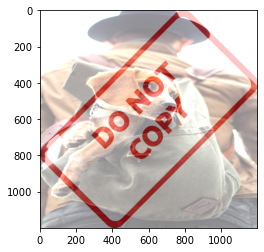

In [20]:
blended = cv2.addWeighted(img1, 0.8, img2, 0.5, gamma=0)
plt.imshow(blended)

In [21]:
# Overlay a small image on a larger image (no blending)
# numpy reassignment
img1 = cv2.imread('/Users/elmiraghahramani/Documents/GitHub/computer_vision_Udemy_course/DATA/'+'dog_backpack.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('/Users/elmiraghahramani/Documents/GitHub/computer_vision_Udemy_course/DATA/'+'watermark_no_copy.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

In [22]:
img2 = cv2.resize(img2, (600,600))

In [23]:
large_img = img1
small_img = img2

In [25]:
x_offset = 0
y_offset = 0

In [26]:
x_end = x_offset + small_img.shape[1]
y_end = y_offset + small_img.shape[0]

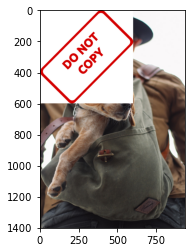

In [28]:
large_img[y_offset:y_end, x_offset:x_end] = small_img
plt.imshow(large_img)

In [3]:
# blend images of different sizes
img1 = cv2.imread('/Users/elmiraghahramani/Documents/GitHub/computer_vision_Udemy_course/DATA/'+'dog_backpack.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('/Users/elmiraghahramani/Documents/GitHub/computer_vision_Udemy_course/DATA/'+'watermark_no_copy.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

In [4]:
img2 = cv2.resize(img2, (600,600))

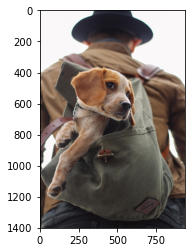

In [5]:
plt.imshow(img1)

In [6]:
img1.shape

(1401, 934, 3)

In [7]:
x_offset = 934 - 600
y_offset = 1401 - 600

In [8]:
img2.shape

(600, 600, 3)

In [9]:
rows, cols, channels = img1.shape

In [10]:
roi = img1[y_offset:1401,x_offset:934]

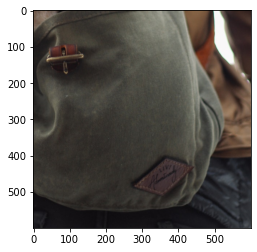

In [11]:
plt.imshow(roi)

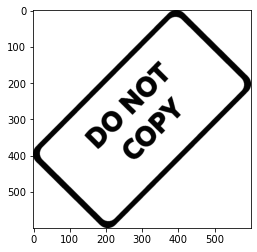

In [13]:
img2gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
plt.imshow(img2gray, cmap='gray')

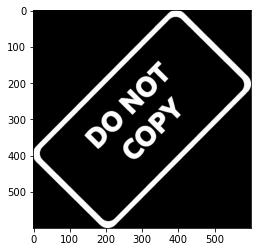

In [15]:
mask_inv = cv2.bitwise_not(img2gray)
plt.imshow(mask_inv, cmap='gray')

In [16]:
import numpy as np

In [23]:
white_bg = np.full(img2.shape,255, dtype=np.uint8) # np.full = ones * number
white_bg.shape

(600, 600, 3)

In [26]:
bk = cv2.bitwise_or(white_bg, white_bg, mask=mask_inv)
bk.shape

(600, 600, 3)

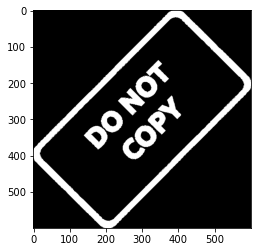

In [28]:
plt.imshow(bk)

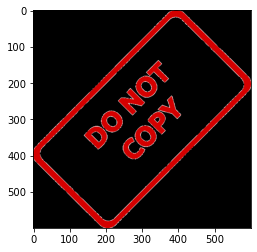

In [29]:
fg = cv2.bitwise_or(img2, img2, mask=mask_inv)
plt.imshow(fg)

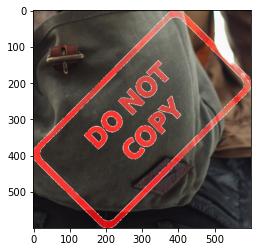

In [30]:
final_roi = cv2.bitwise_or(roi,fg)
plt.imshow(final_roi)

In [31]:
large_img = img1
small_img = final_roi

In [32]:
large_img[y_offset:y_offset+small_img.shape[0], x_offset:x_offset+small_img.shape[1]] = small_img

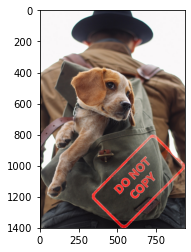

In [34]:
plt.imshow(large_img)

# Thresholding image

In [35]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [36]:
img = cv2.imread('Data/rainbow.jpg')

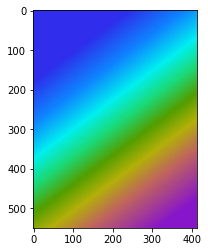

In [37]:
plt.imshow(img)

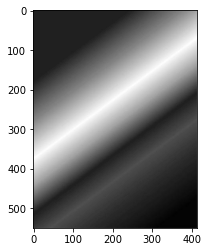

In [39]:
img = cv2.imread('Data/rainbow.jpg',0) # to read image in grayscale
plt.imshow(img,cmap='gray')

In [40]:
img.max() # image is a 0-255 gray scale

214

In [41]:
ret, thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

In [42]:
ret # cut off value

127.0

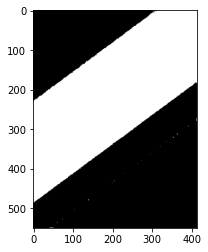

In [43]:
plt.imshow(thresh1,cmap='gray')

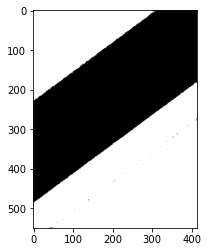

In [44]:
ret, thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
plt.imshow(thresh1,cmap = 'gray')

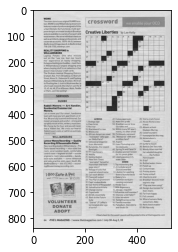

In [45]:
img = cv2.imread('DATA/crossword.jpg',0)
plt.imshow(img, cmap='gray')

In [49]:
def show_pic(img):
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap='gray')

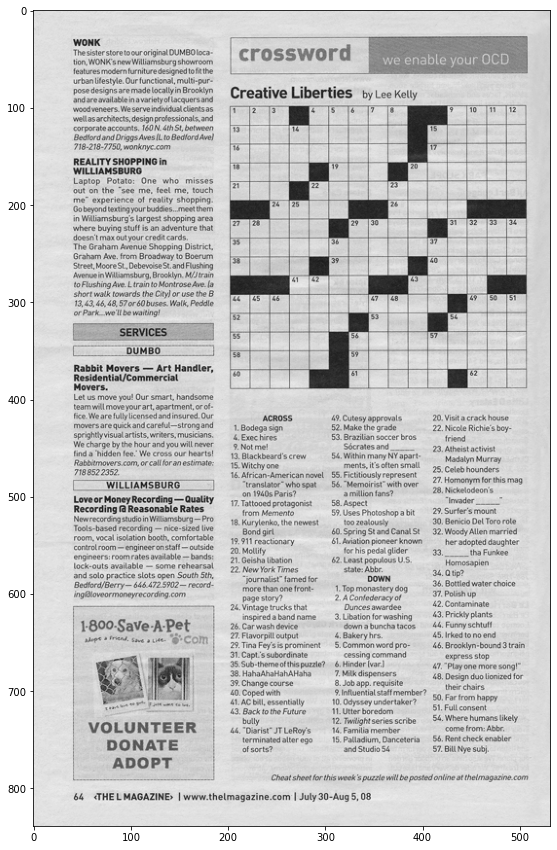

In [50]:
show_pic(img)

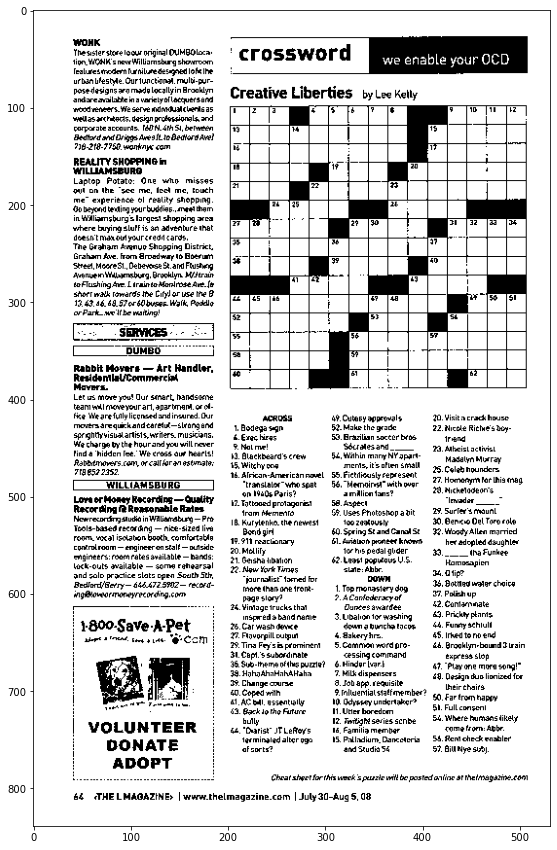

In [55]:
ret, th1 = cv2.threshold(img,160,255,cv2.THRESH_BINARY)
show_pic(th1)

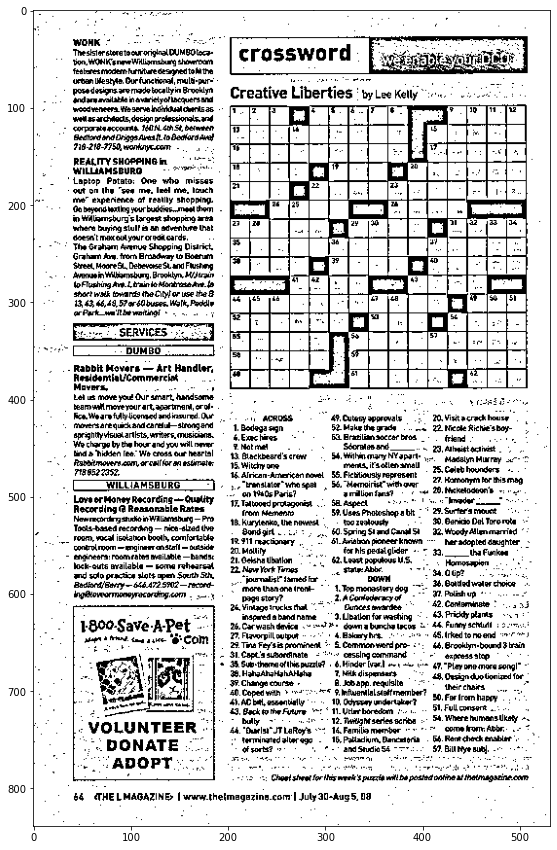

In [57]:
# Adaptive thresholding
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,8)
show_pic(th2)

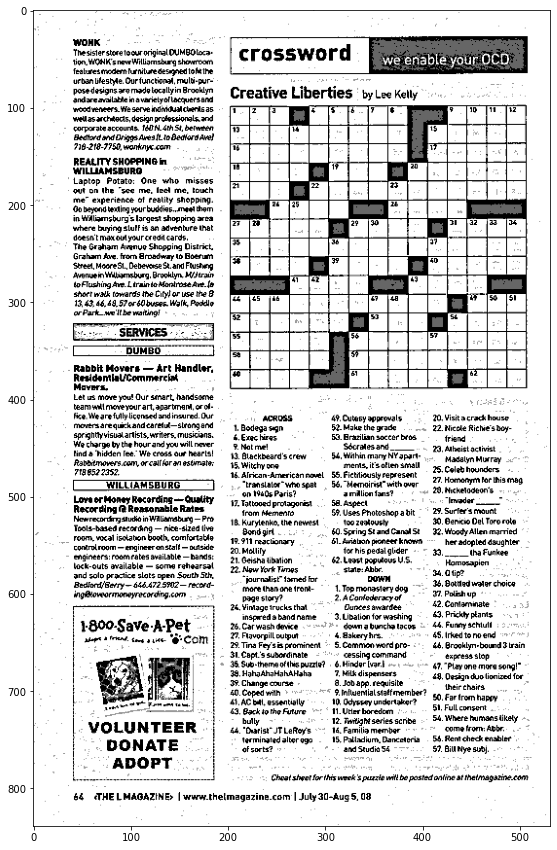

In [59]:
blended = cv2.addWeighted(src1=th1, alpha=0.6, src2=th2, beta=0.4,gamma=0)
show_pic(blended)

# Blurring and smoothing

In [60]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [61]:
def load_img():
    img = cv2.imread('DATA/bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [63]:
# load_img()

In [65]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

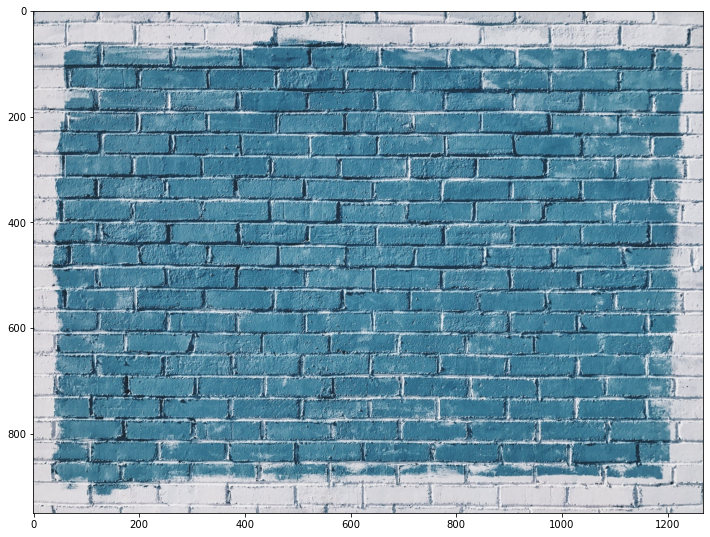

In [67]:
i = load_img()
display_img(i)

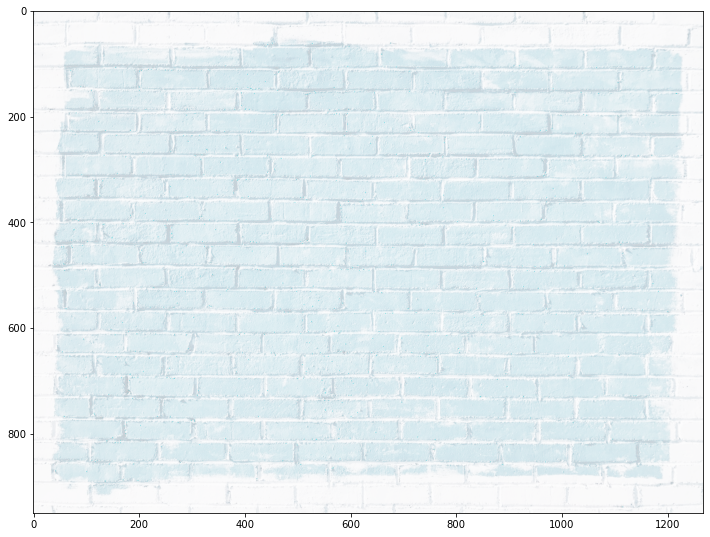

In [72]:
# gamma correction change brightness
gamma = 1/9
result = np.power(i, gamma)
display_img(result)

In [75]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600),fontFace=font,fontScale=10,color=(255,0,0), thickness=4);

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


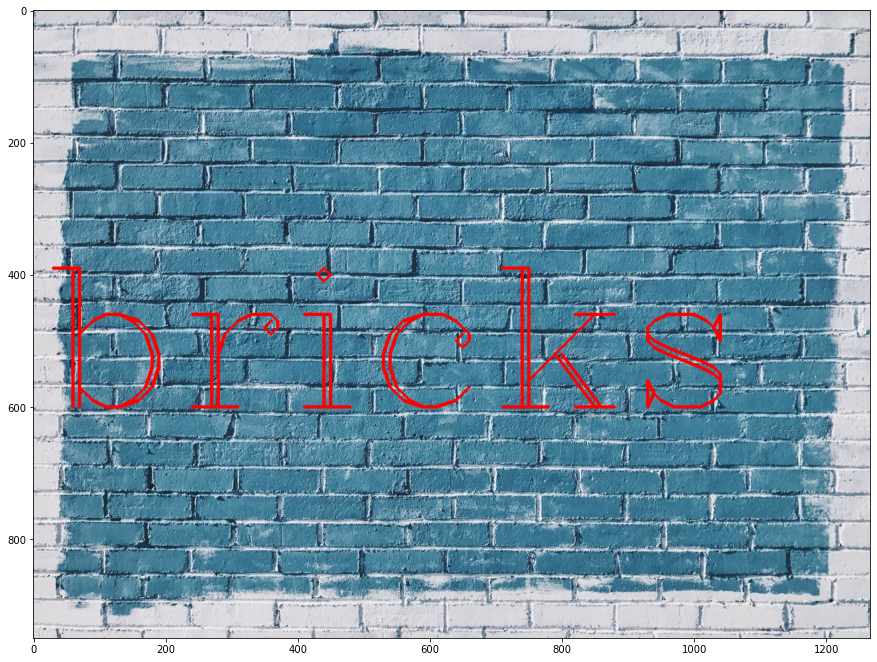

In [76]:
show_pic(img)

In [82]:
kernel = np.ones(shape=(5,5),dtype=np.float32) / 25
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [81]:
1/255

0.00392156862745098

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


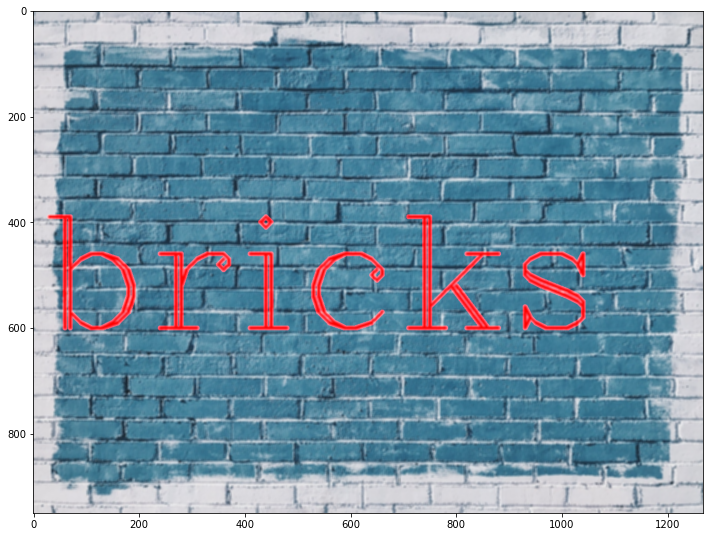

In [83]:
dst = cv2.filter2D(img,-1,kernel)
display_img(dst)

In [85]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600),fontFace=font,fontScale=10,color=(255,0,0), thickness=4);
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


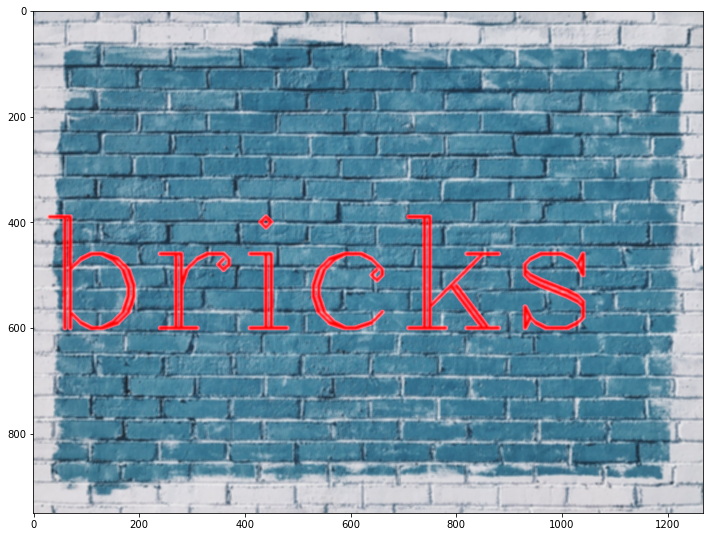

In [88]:
blurred = cv2.blur(img, ksize=(5,5))
display_img(blurred)

In [89]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600),fontFace=font,fontScale=10,color=(255,0,0), thickness=4);
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


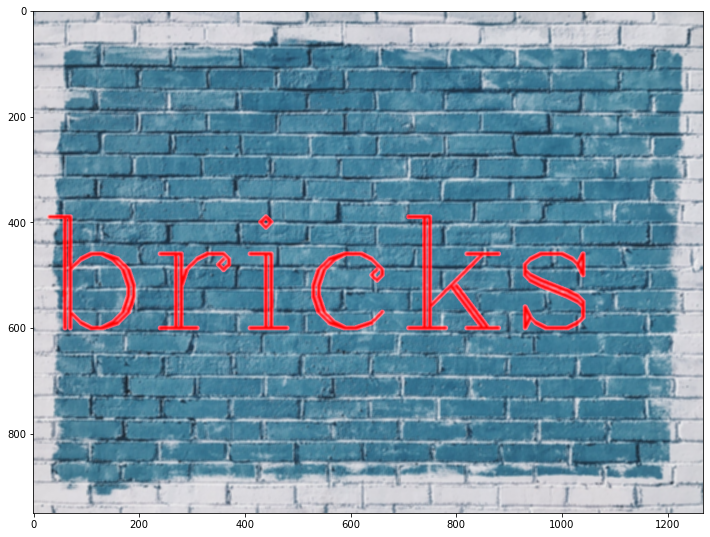

In [92]:
im_gauss = cv2.GaussianBlur(img,(5,5),10)
display_img(im_gauss)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


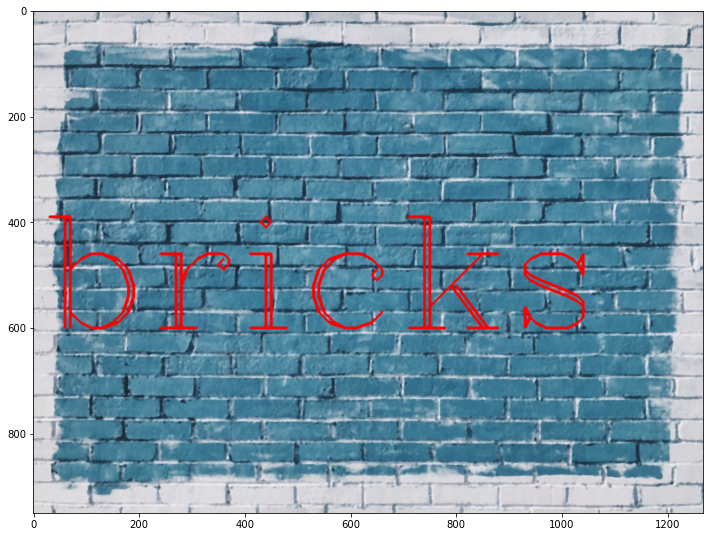

In [93]:
im_med = cv2.medianBlur(img,5)
display_img(im_med)

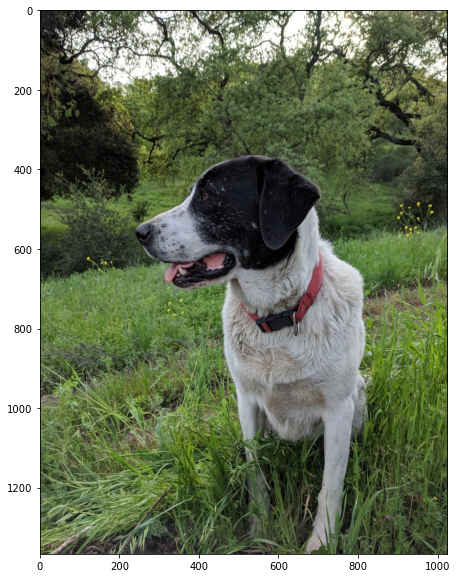

In [94]:
img = cv2.imread('DATA/sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img(img)

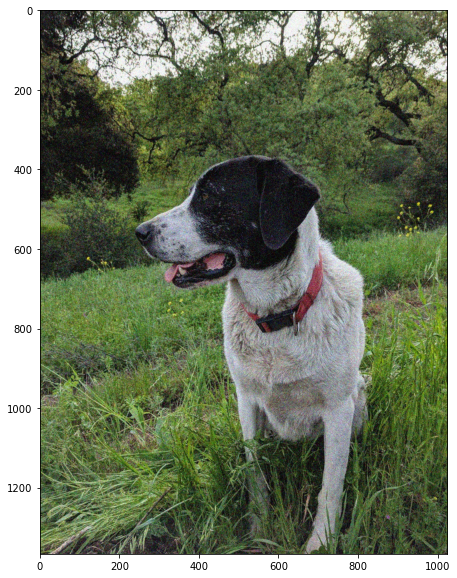

In [95]:
noise_img = cv2.imread('DATA/sammy_noise.jpg')
display_img(noise_img)

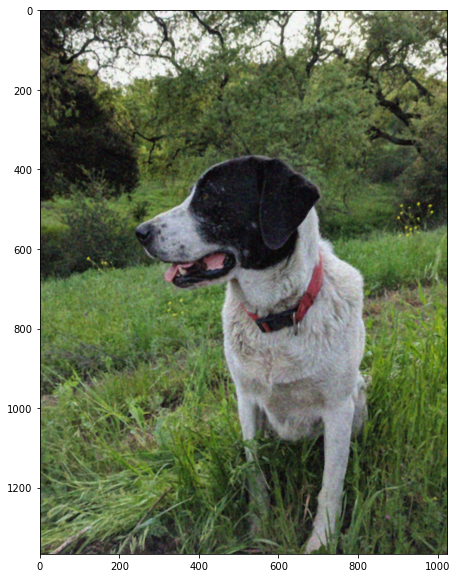

In [96]:
med = cv2.medianBlur(noise_img,5)
display_img(med)

In [97]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600),fontFace=font,fontScale=10,color=(255,0,0), thickness=4);
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


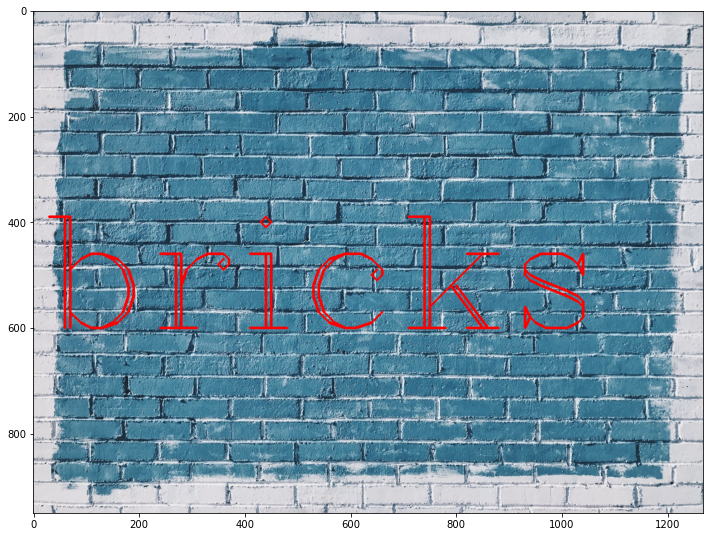

In [98]:
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


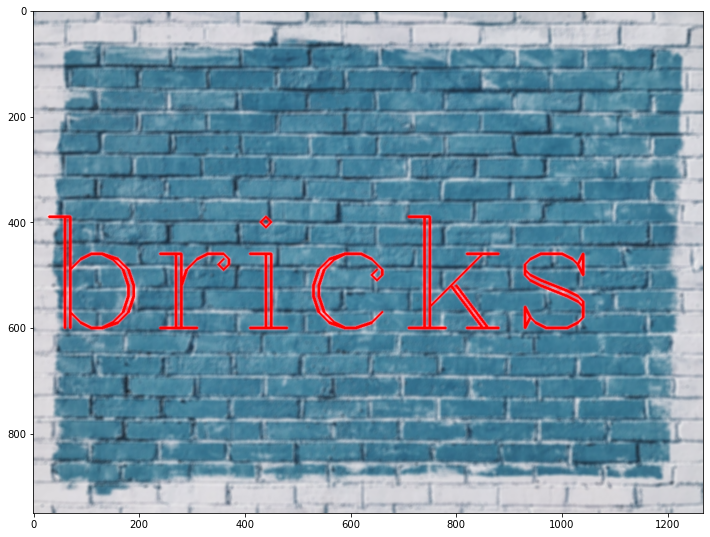

In [99]:
blur = cv2.bilateralFilter(img,9,75,75) # reduce noise, keep edges
display_img(blur)

# Morphological operators

In [111]:
def load_img():
    blank = np.zeros((600,600))
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(blank,text='ABCDE',org=(50,300),fontFace=font,fontScale=5,color=(255,255,255),thickness=25)
    return blank

In [105]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')

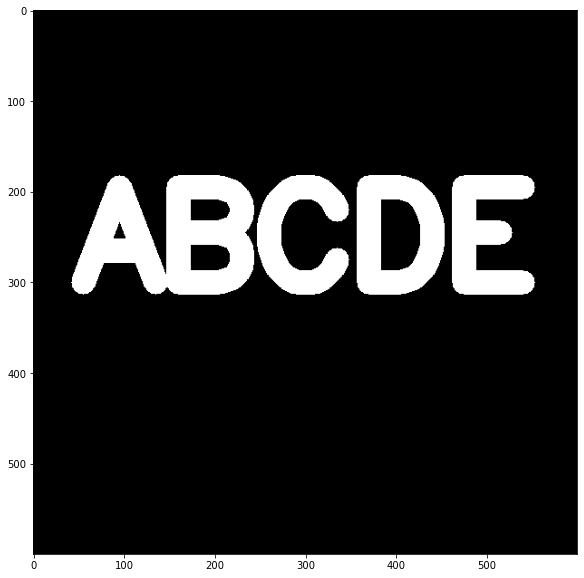

In [115]:
img = load_img()
display_img(img)

In [113]:
kernel = np.ones((5,5),dtype=np.uint8)
kernel

array([[1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1]], dtype=uint8)

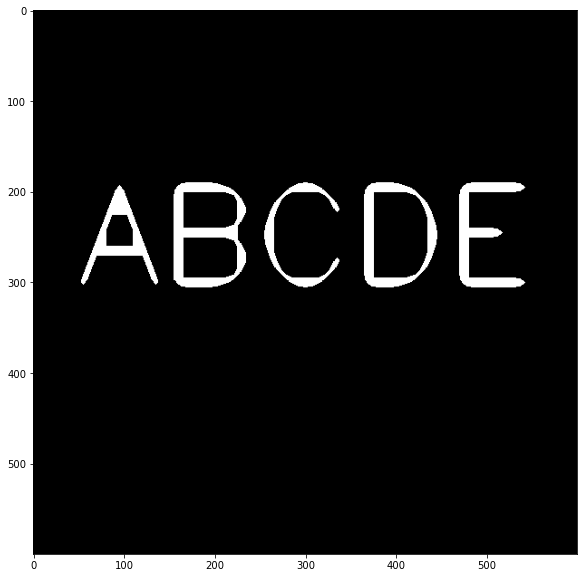

In [118]:
result = cv2.erode(img, kernel, iterations=4)
display_img(result)

In [124]:
# opening = dilation + erosion
w_noise = np.random.randint(low=0,high=2,size=(600,600))
w_noise

array([[1, 0, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 1],
       ...,
       [0, 1, 0, ..., 1, 0, 0],
       [0, 0, 1, ..., 1, 0, 0],
       [0, 1, 0, ..., 1, 1, 1]])

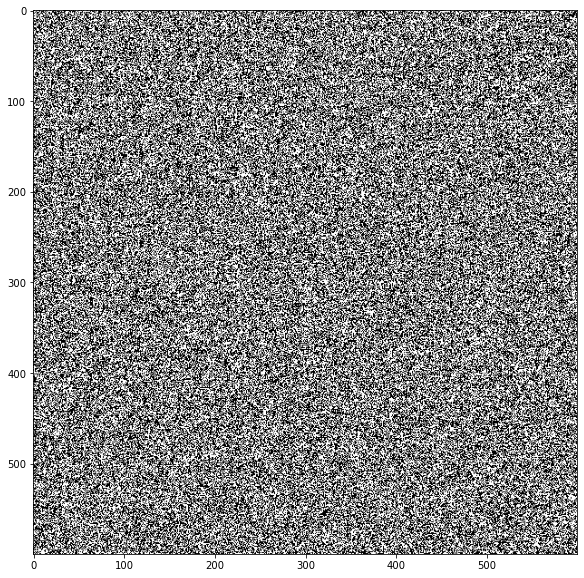

In [125]:
display_img(w_noise)

In [128]:
img.max()

255.0

In [129]:
w_noise = w_noise*255

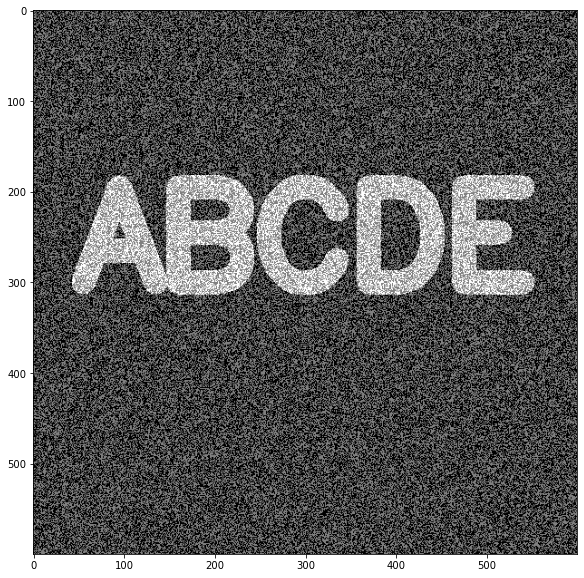

In [131]:
noise_img = img + w_noise
display_img(noise_img)

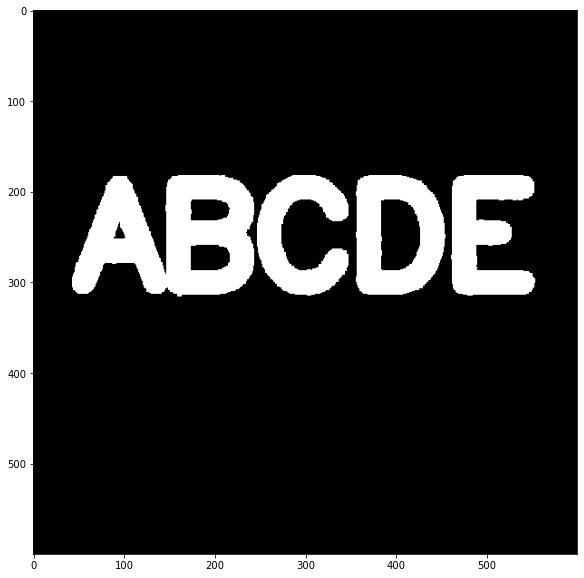

In [132]:
# light forground in a noisey dark background --> opening
opening = cv2.morphologyEx(noise_img,cv2.MORPH_OPEN,kernel)
display_img(opening)

In [134]:
bl_noise = np.random.randint(0,2,(600,600)) * -255

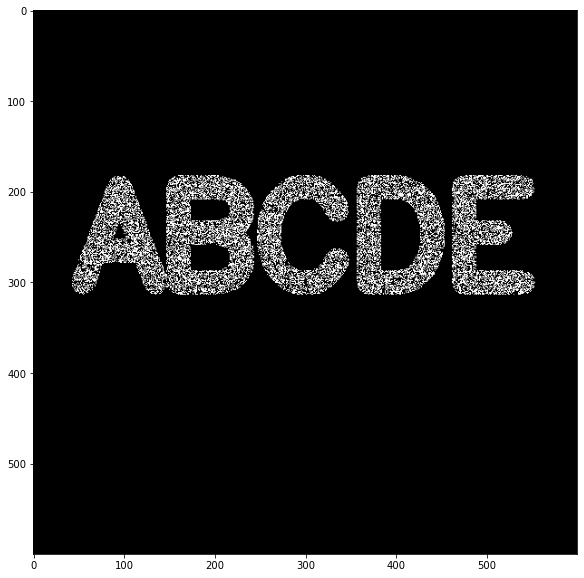

In [135]:
bl_noise_img = img + bl_noise
bl_noise_img[bl_noise_img == -255] = 0
display_img(bl_noise_img)

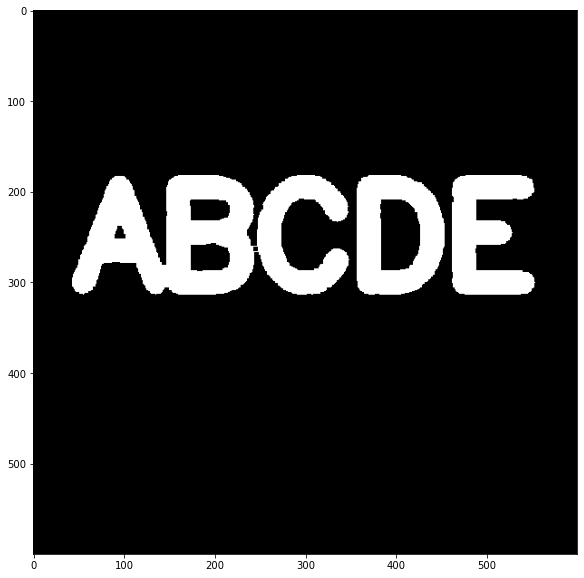

In [136]:
# noisey in foreground --> closing
closing = cv2.morphologyEx(bl_noise_img,cv2.MORPH_CLOSE, kernel)
display_img(closing)

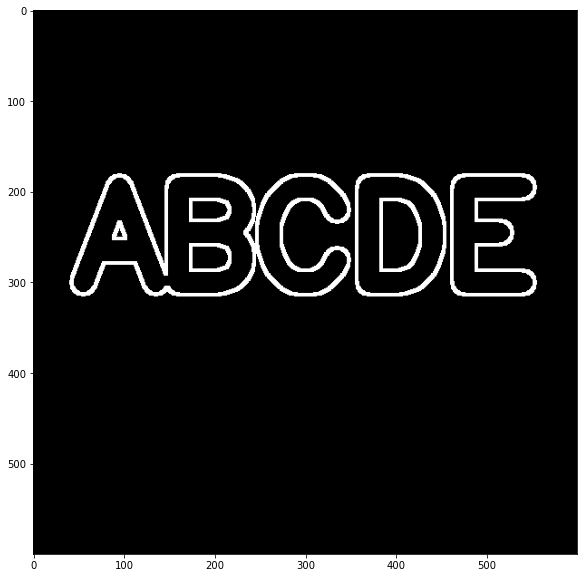

In [137]:
gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT,kernel)
display_img(gradient)